## *Desafio 2 - I2A2 - ABDI*
### *Aluno:João Paulo da Silva Cardoso*

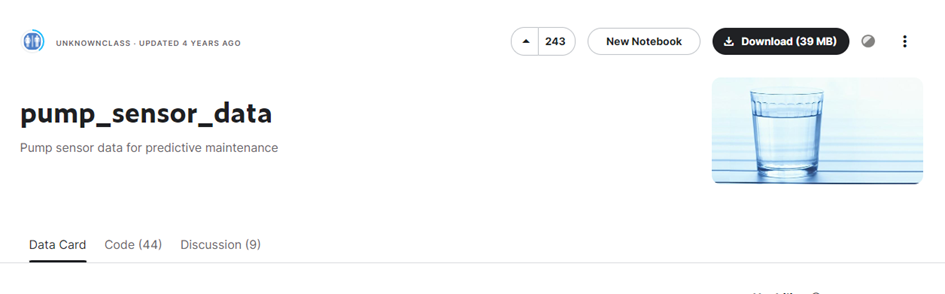

*Disponível em:*
https://www.kaggle.com/datasets/nphantawee/pump-sensor-data

## **1 - Importando as bibliotecas**

In [1]:
import os
from google.colab import drive
from google.colab import auth
from google.colab import files
import IPython
from IPython.display import Image
import pandas as pd
from pandas import read_csv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Configurar estilo seaborn para gráficos
sns.set_style('darkgrid')

## **2 - Importando e carregando o dataset**

### Opção 1: através do Google Drive

In [2]:
# Montar o Google Drive
drive.mount('/content/drive/')

# Autenticar o usuário
auth.authenticate_user()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


### Opção 2: Fazendo upload manualmente

In [3]:
# Fazer upload do arquivo (opcional)
uploaded = files.upload()

### Carregar dataset

In [4]:
# Carregar o dataset
df = pd.read_csv('/content/drive/MyDrive/dataset pump/sensor.csv')

## **3 - Avaliação inicial e limpeza de dados**

### **3.1 Exibindo informações iniciais**

In [5]:
# Para exibir as 5 primeiras linhas do dataframe
df.head()

,Unnamed: 0,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
0,0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
1,1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2,2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,...,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL
3,3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,...,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL
4,4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,...,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL


In [6]:
# Para contar a quantidade de ocorrências de cada valor na coluna 'machine_status'
df['machine_status'].value_counts()

NORMAL        205836
RECOVERING     14477
BROKEN             7
Name: machine_status, dtype: int64

In [7]:
# Encontrar o número de dias em que os dados foram coletados
df.index.max() - df.index.min()

220319

In [8]:
# Informação sobre o formato do dataframe
df.shape

(220320, 55)

In [9]:
# Exibir um resumo das informações do dataframe, como número de linhas, colunas, tipos de dados, uso de memória, etc.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220320 entries, 0 to 220319
Data columns (total 55 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      220320 non-null  int64  
 1   timestamp       220320 non-null  object 
 2   sensor_00       210112 non-null  float64
 3   sensor_01       219951 non-null  float64
 4   sensor_02       220301 non-null  float64
 5   sensor_03       220301 non-null  float64
 6   sensor_04       220301 non-null  float64
 7   sensor_05       220301 non-null  float64
 8   sensor_06       215522 non-null  float64
 9   sensor_07       214869 non-null  float64
 10  sensor_08       215213 non-null  float64
 11  sensor_09       215725 non-null  float64
 12  sensor_10       220301 non-null  float64
 13  sensor_11       220301 non-null  float64
 14  sensor_12       220301 non-null  float64
 15  sensor_13       220301 non-null  float64
 16  sensor_14       220299 non-null  float64
 17  sensor_15 

### **3.2 Excluindo colunas com valores nulos ou NaN, além da inicial**

In [10]:
# Verificar se há valores NaN (not a number)
missing_count= df.isnull().sum() # Para contabilizar valores nulos
value_count=df.isnull().count()
missing_percentage=round(missing_count/value_count *100, 1) # Para indicar o percentual de valores nulos
missing_df= pd.DataFrame({"Quantidade": missing_count, "Percentual": missing_percentage})
print(missing_df)

                Quantidade  Percentual
Unnamed: 0               0         0.0
timestamp                0         0.0
sensor_00            10208         4.6
sensor_01              369         0.2
sensor_02               19         0.0
sensor_03               19         0.0
sensor_04               19         0.0
sensor_05               19         0.0
sensor_06             4798         2.2
sensor_07             5451         2.5
sensor_08             5107         2.3
sensor_09             4595         2.1
sensor_10               19         0.0
sensor_11               19         0.0
sensor_12               19         0.0
sensor_13               19         0.0
sensor_14               21         0.0
sensor_15           220320       100.0
sensor_16               31         0.0
sensor_17               46         0.0
sensor_18               46         0.0
sensor_19               16         0.0
sensor_20               16         0.0
sensor_21               16         0.0
sensor_22               4

In [11]:
# Descartar coluna do sensor_50, sensor_51 e sensor_00 por apresentarem muitos valores NaN, e possuir porcentagem de nulos muito maiores que 2%
df.drop(columns=['Unnamed: 0','sensor_15','sensor_50','sensor_51','sensor_00'],inplace=True)

In [12]:
# Verificar se há valores NaN (not a number)
missing_count= df.isnull().sum() # Exibe a quantidade de valores nulos 
value_count=df.isnull().count()
missing_percentage=round(missing_count/value_count *100, 1) # Exibe o percentual de valores nulos
missing_df= pd.DataFrame({"Quantidade": missing_count, "Percentual": missing_percentage})
print(missing_df)

                Quantidade  Percentual
timestamp                0         0.0
sensor_01              369         0.2
sensor_02               19         0.0
sensor_03               19         0.0
sensor_04               19         0.0
sensor_05               19         0.0
sensor_06             4798         2.2
sensor_07             5451         2.5
sensor_08             5107         2.3
sensor_09             4595         2.1
sensor_10               19         0.0
sensor_11               19         0.0
sensor_12               19         0.0
sensor_13               19         0.0
sensor_14               21         0.0
sensor_16               31         0.0
sensor_17               46         0.0
sensor_18               46         0.0
sensor_19               16         0.0
sensor_20               16         0.0
sensor_21               16         0.0
sensor_22               41         0.0
sensor_23               16         0.0
sensor_24               16         0.0
sensor_25               3

### **3.3 Conversões de dados**

In [13]:
# Converter timestamp para um objeto DatetimeIndex, que é necessário para análise de séries temporais em pandas
df.timestamp=pd.to_datetime(df.timestamp)

In [14]:
# Converter coluna machine_status para dado do tipo categorico Isso ajudará a reduzir o tamanho do dataframe e a acelerar as operações de análise, pois as colunas categóricas são armazenadas internamente como inteiros, em vez de strings.
df.machine_status=df.machine_status.astype('category')

In [15]:
# Transformar timestamp para o indice. Essa transformação é necessária quando você deseja realizar uma análise de séries temporais, pois ela fornece uma maneira fácil de acessar e manipular dados com base em uma escala de tempo
df.set_index('timestamp',inplace=True)

In [16]:
# Verificar se não há duplicação no indice. Essa verificação é importante porque, em uma análise de séries temporais, é essencial que os índices não contenham duplicatas, pois isso pode levar a problemas como perda de dados e imprecisão em cálculos de estatísticas descritivas e outras métricas
df.index.is_unique

True

In [17]:
# Converter para dias em que os dados foram coletados
df.index.max() - df.index.min()

Timedelta('152 days 23:59:00')

 *Os dados iniciais mostram que existem 52 sensores (um por cada coluna) que registraram dados a cada 1 minuto. Possuindo 220320 registros, com isso, o presente conjunto de dados representa um período de 153 dias. Além disso, as medições têm escalas diferentes.*

 *Foi realizado uma limpeza na tabela inicial, além do indice inicial "Unnamed: 0" a eliminação de sensores que possuiam um percentual bem maior que 2% de dados faltantes ou valores NaN(not a number), especificamente, os sensores: sensor_00, sensor_15, sensor_50 e sensor_51.*

## **4 - Análise exploratória de dados**

### 4.1 - Criação de coluna de inteiro para equiparar classes categóricas

In [18]:
# Transformar machine_status de string para tipo inteiro 
conditions = [(df['machine_status'] == 'NORMAL'), 
              (df['machine_status'] == 'BROKEN'), 
              (df['machine_status'] == 'RECOVERING')]
choices = [1, 0, 2] # Existem três condições possíveis
df['Operation'] = np.select(conditions, choices, default=0)

In [19]:
# Estatística básica do dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sensor_01,219951.0,47.591611,3.296666,0.000000,46.310760,48.133678,49.479160,56.727430
sensor_02,220301.0,50.867392,3.666820,33.159720,50.390620,51.649300,52.777770,56.032990
sensor_03,220301.0,43.752481,2.418887,31.640620,42.838539,44.227428,45.312500,48.220490
sensor_04,220301.0,590.673936,144.023912,2.798032,626.620400,632.638916,637.615723,800.000000
sensor_05,220301.0,73.396414,17.298247,0.000000,69.976260,75.576790,80.912150,99.999880
sensor_06,215522.0,13.501537,2.163736,0.014468,13.346350,13.642940,14.539930,22.251160
sensor_07,214869.0,15.843152,2.201155,0.000000,15.907120,16.167530,16.427950,23.596640
sensor_08,215213.0,15.200721,2.037390,0.028935,15.183740,15.494790,15.697340,24.348960
sensor_09,215725.0,14.799210,2.091963,0.000000,15.053530,15.082470,15.118630,25.000000
sensor_10,220301.0,41.470339,12.093519,0.000000,40.705260,44.291340,47.463760,76.106860


### 4.2 - Seleção de colunas para plotagem

In [20]:
# Pegar colunas e linhas de interesse para plotar
sensor_cols = df.iloc[:,1:49]
broken_rows = df[df['machine_status']=='BROKEN']
recovery_rows = df[df['machine_status']=='RECOVERING']
normal_rows = df[df['machine_status']=='NORMAL']
machine_status_col = df['machine_status']

### 4.3 - Plotagem de gráficos de barra e de pizza

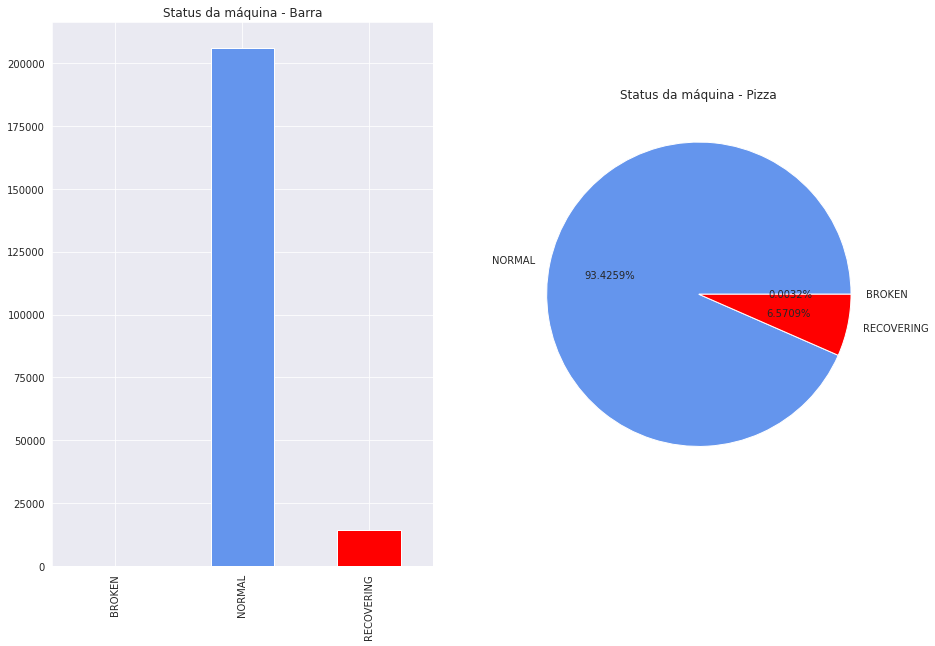

In [21]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,10))
df.groupby('machine_status').size().plot(kind='bar', ax=ax1, color=['black', 'cornflowerblue', 'red'])
df.groupby('machine_status').size().plot(kind='pie', ax=ax2, autopct='%.4f%%', colors=['black', 'cornflowerblue', 'red'])
ax1.set_title('Status da máquina - Barra')
ax1.set_xlabel('')
ax2.set_title('Status da máquina - Pizza')
ax2.set_ylabel('')
plt.show()

### 4.4 - Plotagem de gráficos de linha

array([<AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabel='timestamp'>, <AxesSubplot:xlabel='timestamp'>,
       <AxesSubplot:xlabe

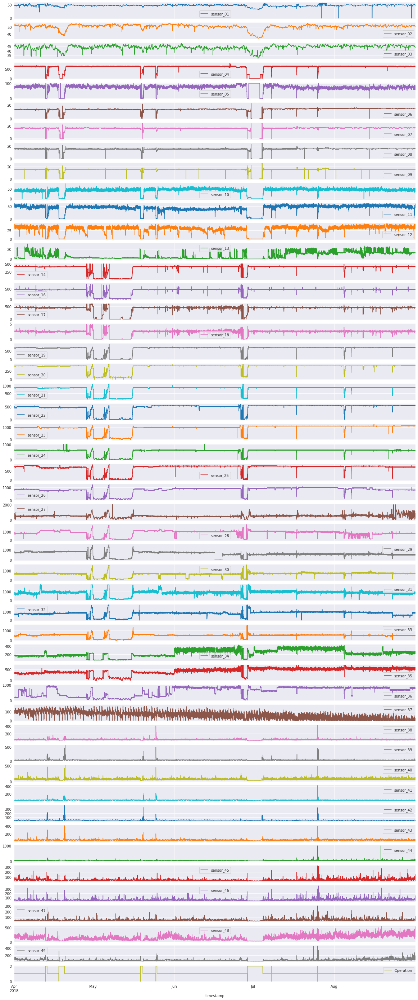

In [22]:
# Plotando as séries dos sensores e da classe criada Operation, para visualização geral
status = [(df['machine_status'] == 'NORMAL'), (df['machine_status'] == 'BROKEN'), (df['machine_status'] == 'RECOVERING')]
label_encoding = [1, 0, 2]
df['Operation'] = np.select(status, choices, default=0)
df.plot(subplots=True, sharex=True, figsize=(20, 50))

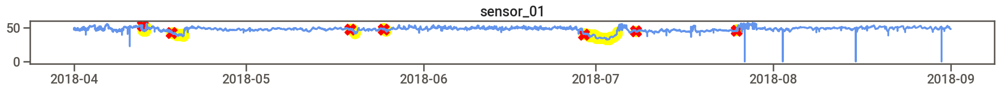

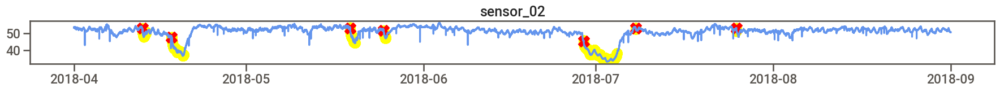

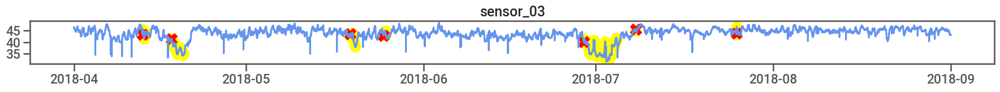

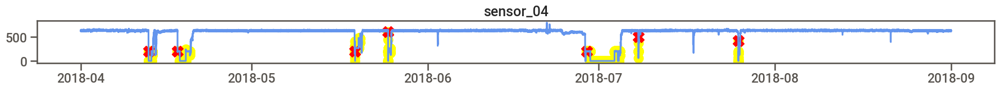

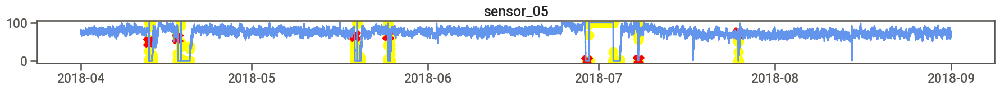

...

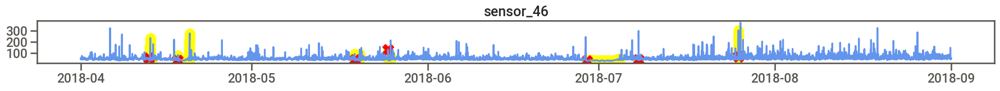

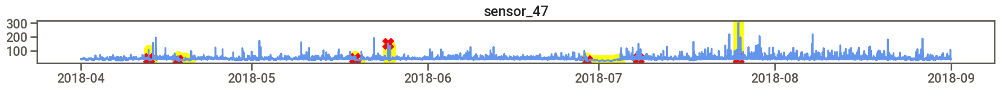

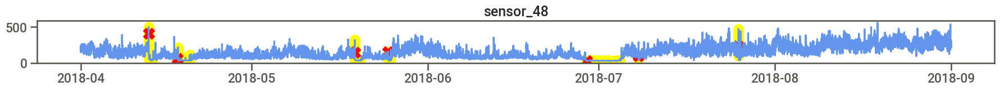

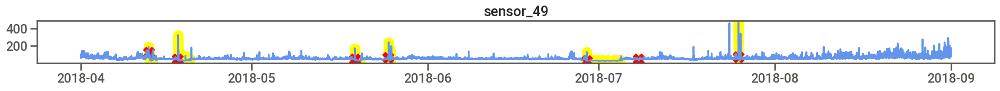

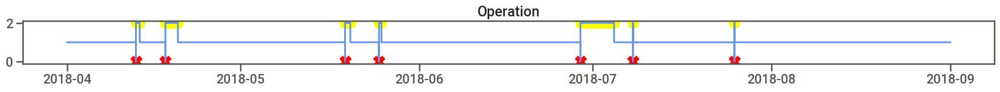

In [34]:
# Visualize nas séries temporais e o estado BROKEN (X vermelhos) e RECOVERING (pontos amarelos) no mesmo gráfico para cada sensor
import warnings
# Extraia as leituras do estado BROKEN e refaça a média diária
broken = df[df['machine_status']=='BROKEN']
# Extraia as leituras do estado RECOVERING e refaça a média diária
recovery = df[df['machine_status']=='RECOVERING']
# Extract the names of the numerical columns
df2 = df.drop(['machine_status'], axis=1)
names=df2.columns
# Plot time series for each sensor with BROKEN state marked with X in red color
for name in names:
    sns.set_context('talk')
    _ = plt.figure(figsize=(22,1))
    _ = plt.plot(recovery[name], linestyle='none', marker='o', color='yellow', markersize=12)
    _ = plt.plot(broken[name], linestyle='none', marker='X', color='red', markersize=14)
    _ = plt.plot(df[name], color='cornflowerblue')    
    _ = plt.title(name)
    plt.show()

*Como pode ser visto, existem padrões de sinais sendo capturados pelos os respectivos grupos de sensores:*

*   *(1,2,3)*
*   *(4,5,6,7,8,9)*
*   *(10,11,12)*
*   *(14,16,17,18)*
*   *(19,20,21,22,23,24)*
*   *(25,26,28,29,30,31,32,33)*
*   *(34,35)*
*   *(38,39,40,41,42,43,45,46,47)* 

*Por sua vez, há sinais que são muito ruidosos e parecem não seguir nenhuma tendência em particular.*

### 4.5 - Nova avaliação do dataframe para eliminar todos os valores nulos existentes

In [24]:
# utilizando método para preenchimento de dados faltantes
df.fillna(method = 'ffill' , inplace = True)

In [25]:
# Verificando novamente os valores ausentes para garantir
missing_count= df.isnull().sum() # count the number of missing values
value_count=df.isnull().count()
missing_percentage=round(missing_count/value_count *100, 1) # Percentual de valores faltantes
missing_df= pd.DataFrame({"count": missing_count, "percentage": missing_percentage})
print(missing_df)

                count  percentage
sensor_01           0         0.0
sensor_02           0         0.0
sensor_03           0         0.0
sensor_04           0         0.0
sensor_05           0         0.0
sensor_06           0         0.0
sensor_07           0         0.0
sensor_08           0         0.0
sensor_09           0         0.0
sensor_10           0         0.0
sensor_11           0         0.0
sensor_12           0         0.0
sensor_13           0         0.0
sensor_14           0         0.0
sensor_16           0         0.0
sensor_17           0         0.0
sensor_18           0         0.0
sensor_19           0         0.0
sensor_20           0         0.0
sensor_21           0         0.0
sensor_22           0         0.0
sensor_23           0         0.0
sensor_24           0         0.0
sensor_25           0         0.0
sensor_26           0         0.0
sensor_27           0         0.0
sensor_28           0         0.0
sensor_29           0         0.0
sensor_30     

In [26]:
# verificando se os status não são todos do mesmo valor
df.machine_status.unique() 

['NORMAL', 'BROKEN', 'RECOVERING']
Categories (3, object): ['BROKEN', 'NORMAL', 'RECOVERING']

In [27]:
# Analisando uma estatística básica novamente
df.describe().T

,count,mean,std,min,25%,50%,75%,max
sensor_01,220320.0,47.597254,3.302558,0.000000,46.310760,48.133680,49.479160,56.727430
sensor_02,220320.0,50.867093,3.667314,33.159720,50.390620,51.649300,52.777770,56.032990
sensor_03,220320.0,43.752337,2.418979,31.640620,42.838539,44.227428,45.312500,48.220490
sensor_04,220320.0,590.664106,144.042134,2.798032,626.620400,632.638916,637.615723,800.000000
sensor_05,220320.0,73.394872,17.301042,0.000000,69.976258,75.576430,80.911770,99.999880
sensor_06,220320.0,13.209623,2.901954,0.014468,13.317420,13.628470,14.539930,22.251160
sensor_07,220320.0,15.498316,3.152707,0.000000,15.856480,16.167530,16.427950,23.596640
sensor_08,220320.0,14.872618,2.956980,0.028935,15.147570,15.451390,15.697340,24.348960
sensor_09,220320.0,14.491819,2.956122,0.000000,15.010130,15.082470,15.118630,25.000000
sensor_10,220320.0,41.469733,12.094658,0.000000,40.704892,44.291375,47.464360,76.106860


In [28]:
# Verificando o dataframe novamente
df.head()

,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,machine_status,Operation
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,37.22740,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,NORMAL,1
2018-04-01 00:01:00,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,37.22740,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,NORMAL,1
2018-04-01 00:02:00,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,37.86777,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,NORMAL,1
2018-04-01 00:03:00,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,38.57977,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,NORMAL,1
2018-04-01 00:04:00,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,39.48939,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,NORMAL,1


## **5 - Relatório com Pandas Profiling**
[Um breve tutorial sobre a biblioteca Pandas Profiling](https://www.youtube.com/watch?v=Z3t7lnjqzpY)

### **5.1 Instalação**

In [29]:
# Instalação
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
# Importação
from ydata_profiling import ProfileReport

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


### **5.2 Análise**

In [30]:
# Análise com Pofiling
# profile = ProfileReport(df, title='Machine Status Data', explorative=True) # mais completa, pode travar no colab
profile = ProfileReport(df, title='Relatório de Status de Máquina', minimal=True) # análise mínima
profile.to_file(output_file="Relatório Profiling.html") # Para exportar página html, visualize no colab
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## **6 - Relatório com Sweetviz**
[Um breve tutorial sobre a biblioteca Pandas Profiling](https://www.youtube.com/watch?v=UR_OK8vBpeY&t=398s)

### **6.1 Instalação e importação de biblioteca**

In [31]:
# Instalação
!pip install sweetviz
# Importação
import sweetviz as sv

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### **6.2 Análise**

In [32]:
analyze_report = sv.analyze(df)
analyze_report.show_html('Relatório Sweetviz.html', open_browser=False)

                                             |          | [  0%]   00:00 -> (? left)

Report Relatório Sweetviz.html was generated.



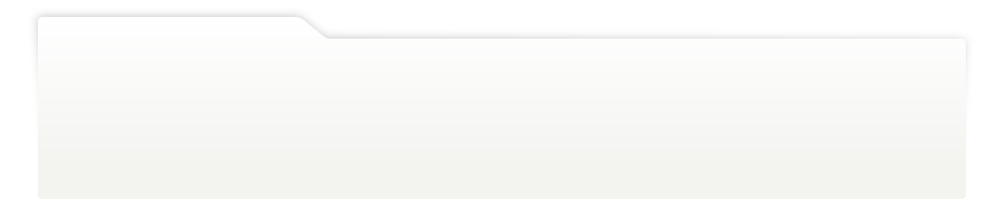
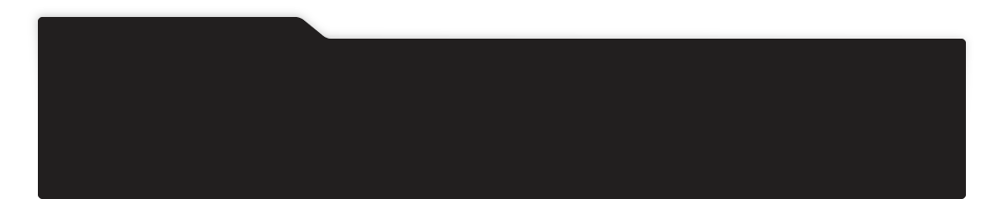
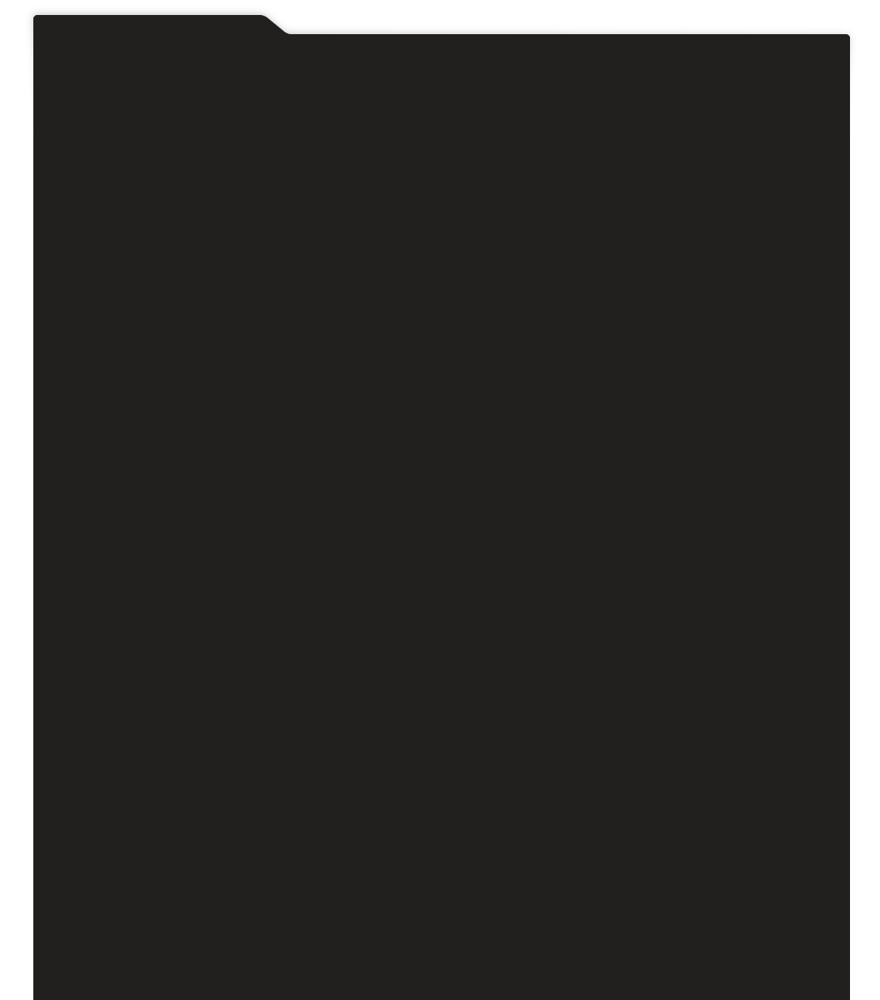
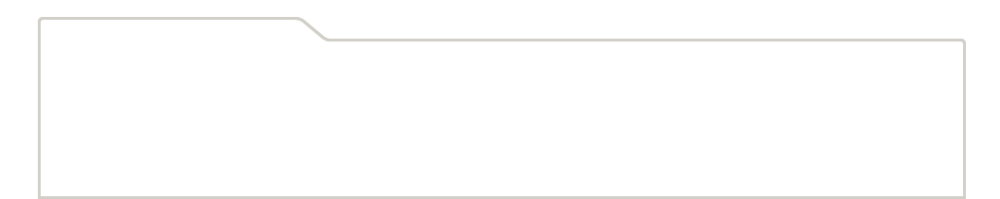
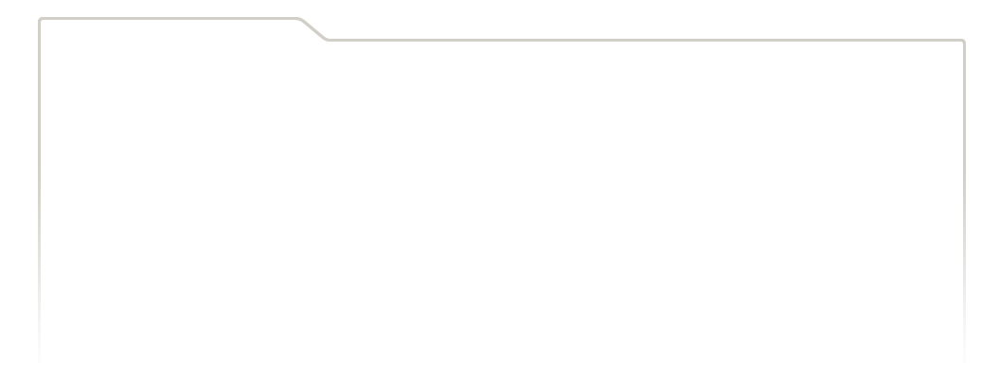
...
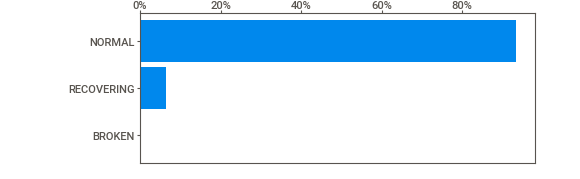
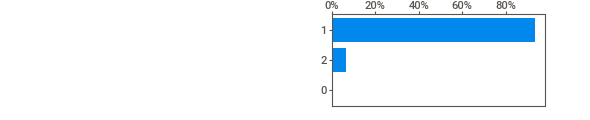
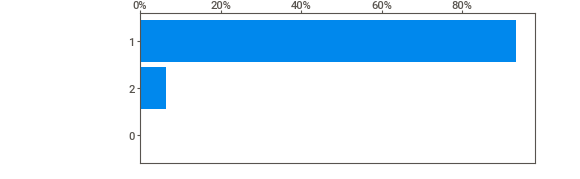
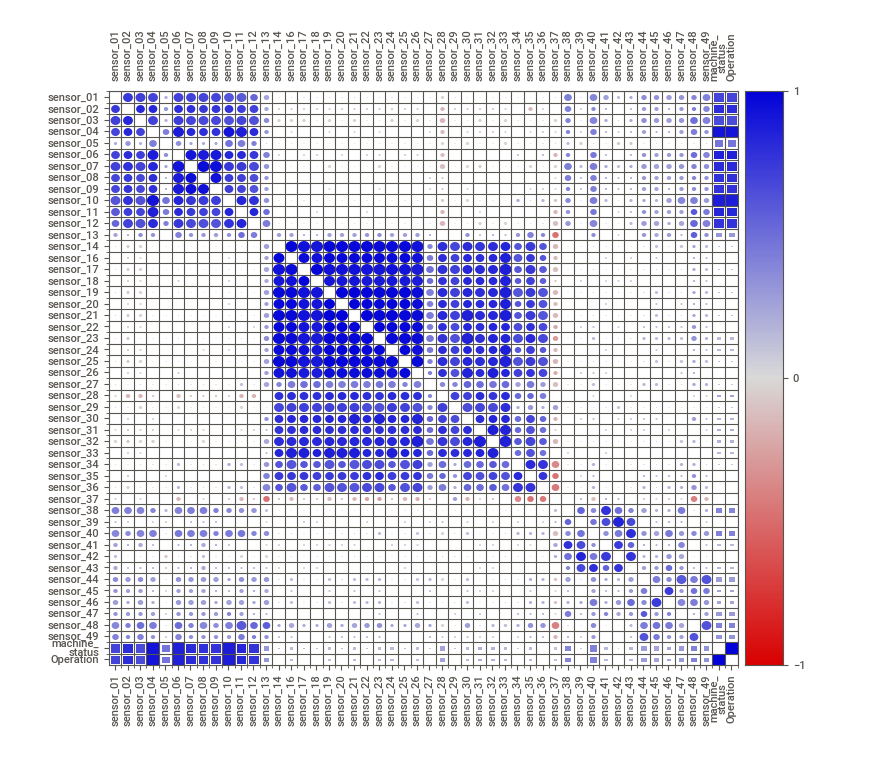
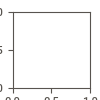

In [33]:
# Visualizar relatório
IPython.display.HTML('Relatório Sweetviz.html')

## **7 - Considerações finais**

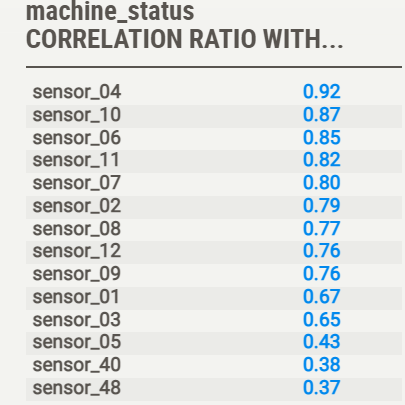

### *Com base no levantamento exploratório dos dados, encontra-se o grau de correlação entre as classes de status da máquina e os sensores. Sendo possível assim, determinar quais sensores possuem maior relevância para determinar o estado de operação da máquina, e assim, viabilizando uma melhor abordagem para monitoramento preditivo de falhas. Apesar de não se ter ido adiante com a criação de um modelo preditivo, é recomendado uma continuidade com features engineering para se ter mais clareza dos padrões dos sensores e o que ocorre antecedendo a falha para assim ser possível uma medida preventiva. Será continuado esse desafio para se tentar criar uma regra de associação melhor entre os padrões dos sensores e as falhas* 